In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
!git clone https://github.com/open-mmlab/mmsegmentation.git

Looking in links: https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
     |████████████████████████████████| 46.6 MB 9.1 MB/s 
     |████████████████████████████████| 190 kB 4.2 MB/s 
Cloning into 'mmsegmentation'...
remote: Enumerating objects: 7020, done.
remote: Counting objects: 100% (32/32), done.
remote: Compressing objects: 100% (26/26), done.
remote: Total 7020 (delta 9), reused 22 (delta 6), pack-reused 6988
Receiving objects: 100% (7020/7020), 13.47 MiB | 13.59 MiB/s, done.
Resolving deltas: 100% (5176/5176), done.


In [3]:
import torch

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 1.11.0+cu113 (Tesla T4)


In [4]:
%cd mmsegmentation

/content/mmsegmentation


In [5]:
from mmseg.apis import inference_segmentor, init_segmentor, show_result_pyplot
import mmcv

In [6]:
import os.path as osp
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

In [7]:
!mkdir checkpoints
!wget -O //content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth https://download.openmmlab.com/mmsegmentation/v0.5/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth

--2022-05-19 02:05:08--  https://download.openmmlab.com/mmsegmentation/v0.5/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.252.96.28
Connecting to download.openmmlab.com (download.openmmlab.com)|47.252.96.28|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 328290585 (313M) [application/octet-stream]
Saving to: ‘//content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth’

//content/mmsegment 100%[===================>] 313.08M  8.81MB/s    in 38s     

2022-05-19 02:05:48 (8.24 MB/s) - ‘//content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth’ saved [328290585/328290585]



In [8]:
from mmseg.datasets.builder import DATASETS
from mmseg.datasets.custom import CustomDataset

classes = ('background', 'building')
palette = [[0, 0, 0], [128, 128, 0]]

@DATASETS.register_module()
class SIADataset(CustomDataset):
  CLASSES = classes
  PALETTE = palette
  def __init__(self, split, **kwargs):
    super().__init__(img_suffix='.png', seg_map_suffix='.png', 
                     split=split, **kwargs)
    assert osp.exists(self.img_dir) and self.split is not None

In [9]:
# config 파일을 설정하고, 다운로드 받은 pretrained 모델을 checkpoint로 설정. 
config_file = '/content/mmsegmentation/configs/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes.py'
checkpoint_file = '/content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth'

from mmcv import Config

cfg = Config.fromfile(config_file)
print(cfg.pretty_text)

norm_cfg = dict(type='SyncBN', requires_grad=True)
model = dict(
    type='EncoderDecoder',
    pretrained=None,
    backbone=dict(
        type='MixVisionTransformer',
        in_channels=3,
        embed_dims=64,
        num_stages=4,
        num_layers=[3, 6, 40, 3],
        num_heads=[1, 2, 5, 8],
        patch_sizes=[7, 3, 3, 3],
        sr_ratios=[8, 4, 2, 1],
        out_indices=(0, 1, 2, 3),
        mlp_ratio=4,
        qkv_bias=True,
        drop_rate=0.0,
        attn_drop_rate=0.0,
        drop_path_rate=0.1,
        init_cfg=dict(type='Pretrained', checkpoint='pretrain/mit_b5.pth')),
    decode_head=dict(
        type='SegformerHead',
        in_channels=[64, 128, 320, 512],
        in_index=[0, 1, 2, 3],
        channels=256,
        dropout_ratio=0.1,
        num_classes=19,
        norm_cfg=dict(type='SyncBN', requires_grad=True),
        align_corners=False,
        loss_decode=dict(
            type='CrossEntropyLoss', use_sigmoid=False, loss_weight=1.0)),
    train_cf

In [10]:
cfg.norm_cfg = dict(type='BN', requires_grad=True)
#cfg.model.backbone.norm_cfg = cfg.norm_cfg
cfg.model.decode_head.norm_cfg = cfg.norm_cfg

cfg.model.decode_head.num_classes = 2

#cfg.model.decode_head.loss_decode = dict(type='DiceLoss', loss_weight = 1.0)

In [11]:
cfg.img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
cfg.crop_size = (512, 512)
cfg.train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations'),
    dict(type='Resize', img_scale=(1024, 1024), ratio_range=(0.5, 2.0)),
    dict(type='RandomCrop', crop_size=cfg.crop_size, cat_max_ratio=0.75),
    dict(type='RandomFlip', flip_ratio=0.5),
    dict(type='PhotoMetricDistortion'),
    dict(type='Normalize', **cfg.img_norm_cfg),
    dict(type='Pad', size=cfg.crop_size, pad_val=0, seg_pad_val=255),
    dict(type='DefaultFormatBundle'),
    dict(type='Collect', keys=['img', 'gt_semantic_seg']),
]

cfg.val_pipeline = [
                    dict(type='LoadImageFromFile'),
                    dict(
                        type='MultiScaleFlipAug',
                        img_scale=(1024, 1024),
                        flip=False,
                        transforms=[
                                    dict(type='Resize', keep_ratio=True),
                                    dict(type='RandomFlip'),
                                    dict(
                                        type='Normalize',
                                        mean=[123.675, 116.28, 103.53],
                                        std=[58.395, 57.12, 57.375],
                                        to_rgb=True),
                                    dict(type='ImageToTensor', keys=['img']),
                                    dict(type='Collect', keys=['img'])
                                    ]),
                    
]

cfg.test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(
        type='MultiScaleFlipAug',
        img_scale=(1024, 1024),
        img_ratios=[0.5, 0.75, 1.0, 1.25, 1.5, 1.75],
        flip=False,
        transforms=[
            dict(type='Resize', keep_ratio=True),
            #dict(type='ResizeToMultiple', size_divisor=32),
            dict(type='RandomFlip'),
            dict(type='Normalize', **cfg.img_norm_cfg),
            dict(type='ImageToTensor', keys=['img']),
            dict(type='Collect', keys=['img']),
        ])
]

In [12]:
cfg.dataset_type = 'SIADataset'
cfg.data_root = '/content/drive/MyDrive/SIA'

cfg.data.train.type = 'SIADataset'
cfg.data.train.data_root = '/content/drive/MyDrive/SIA'
cfg.data.train.img_dir = 'Data_set/building_dataset/img_dir/train'
cfg.data.train.ann_dir = 'Data_set/building_dataset/ann_dir/train'
cfg.data.train.pipeline = cfg.train_pipeline
cfg.data.train.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/train/up_train_building.txt'

cfg.data.val.type = 'SIADataset'
cfg.data.val.data_root = '/content/drive/MyDrive/SIA'
cfg.data.val.img_dir = 'Data_set/building_dataset/img_dir/train'
cfg.data.val.ann_dir = 'Data_set/building_dataset/ann_dir/train'
cfg.data.val.pipeline = cfg.test_pipeline
cfg.data.val.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/train/up_val_building.txt'

cfg.data.test.type = 'SIADataset'
cfg.data.test.data_root = '/content/drive/MyDrive/SIA'
cfg.data.test.img_dir = 'Data_set/building_dataset/img_dir/val'
cfg.data.test.ann_dir = 'Data_set/building_dataset/ann_dir/val'
cfg.data.test.pipeline = cfg.test_pipeline
cfg.data.test.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/val/up.txt'

<pre><code>cfg.data.train.type = 'SIADataset'
cfg.data.train.data_root = '/content/drive/MyDrive/SIA'
cfg.data.train.img_dir = 'Data_set/building_dataset/img_dir'
cfg.data.train.ann_dir = 'Data_set/building_dataset/ann_dir'
cfg.data.train.pipeline = cfg.train_pipeline
cfg.data.train.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/train/up_train_building.txt'
</code></pre>

In [13]:
cfg.load_from = '/content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth'

# Set up working dir to save files and logs.
cfg.work_dir = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1'

In [14]:
cfg.runner.max_iteTrs = 200
cfg.log_config.interval = 100
cfg.evaluation.interval = 1000  # 모델 학습시 평가를 몇 번째 iteration마다 할 것인지 지정
cfg.checkpoint_config.interval = 1000  # 모델 학습시 학습한 모델을 몇 번째 iteration마다 저장할 것인지 지정

cfg.runner = dict(type='IterBasedRunner', max_iters=20000)  # Iteration으로 동작, Epoch로 동작하게 변경할 수도 있음
# cfg.runner = dict(type='EpochBasedRunner', max_epochs=4000)  # Epoch로 변경
cfg.workflow = [('train', 1)]

# Set seed to facitate reproducing the result
cfg.seed = 0
#set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)

# Let's have a look at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
norm_cfg = dict(type='BN', requires_grad=True)
model = dict(
    type='EncoderDecoder',
    pretrained=None,
    backbone=dict(
        type='MixVisionTransformer',
        in_channels=3,
        embed_dims=64,
        num_stages=4,
        num_layers=[3, 6, 40, 3],
        num_heads=[1, 2, 5, 8],
        patch_sizes=[7, 3, 3, 3],
        sr_ratios=[8, 4, 2, 1],
        out_indices=(0, 1, 2, 3),
        mlp_ratio=4,
        qkv_bias=True,
        drop_rate=0.0,
        attn_drop_rate=0.0,
        drop_path_rate=0.1,
        init_cfg=dict(type='Pretrained', checkpoint='pretrain/mit_b5.pth')),
    decode_head=dict(
        type='SegformerHead',
        in_channels=[64, 128, 320, 512],
        in_index=[0, 1, 2, 3],
        channels=256,
        dropout_ratio=0.1,
        num_classes=2,
        norm_cfg=dict(type='BN', requires_grad=True),
        align_corners=False,
        loss_decode=dict(
            type='CrossEntropyLoss', use_sigmoid=False, loss_weight=1.0)),
    train_cfg

### 모델 학습

In [15]:
from mmseg.datasets import build_dataset
from mmseg.models import build_segmentor
from mmseg.apis import train_segmentor

# Build the dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_segmentor(
    cfg.model, train_cfg=cfg.get('train_cfg'), test_cfg=cfg.get('test_cfg'))

# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_segmentor(model, datasets, cfg, distributed=False, validate=True,
                meta=dict(CLASSES=classes, PALETTE=palette))

2022-05-19 02:05:52,479 - mmseg - INFO - Loaded 537 images
/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '
2022-05-19 02:06:07,533 - mmseg - INFO - Loaded 113 images
2022-05-19 02:06:07,537 - mmseg - INFO - load checkpoint from local path: /content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth
2022-05-19 02:06:07,968 - mmseg - WARNING - The model and loaded state dict do not match exactly

size mismatch for decode_head.conv_seg.weight: copying a param with shape torch.Size([19, 256, 1, 1]) from checkpoint, the shape in current model is torch.Size([2, 256, 1, 1]).
size mismatch for decode_head.conv_seg.bias: copying a param with 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.1 task/s, elapsed: 803s, ETA:     0s

2022-05-19 02:35:13,512 - mmseg - INFO - per class results:
2022-05-19 02:35:13,514 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 86.89 | 94.82 |
|  building  |  73.0 | 80.92 |
+------------+-------+-------+
2022-05-19 02:35:13,516 - mmseg - INFO - Summary:
2022-05-19 02:35:13,517 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 90.32 | 79.95 | 87.87 |
+-------+-------+-------+
2022-05-19 02:35:13,520 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9032, mIoU: 0.7995, mAcc: 0.8787, IoU.background: 0.8689, IoU.building: 0.7300, Acc.background: 0.9482, Acc.building: 0.8092
2022-05-19 02:35:54,412 - mmseg - INFO - Iter [1100/20000]	lr: 4.154e-05, eta: 8:31:23, time: 8.442, data_time: 8.059, memory: 3323, decode.loss_ce: 0.2825, decode.acc_seg: 87.9073, loss: 0.2825
2022-05-19 02:36:32,814 - mmseg - INFO - Iter [1200/20000]	lr: 4.508e-05, eta: 7:56:19, time: 0.384, data

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 713s, ETA:     0s

2022-05-19 02:53:43,164 - mmseg - INFO - per class results:
2022-05-19 02:53:43,166 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 88.89 | 95.39 |
|  building  | 77.25 |  84.7 |
+------------+-------+-------+
2022-05-19 02:53:43,167 - mmseg - INFO - Summary:
2022-05-19 02:53:43,168 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 91.93 | 83.07 | 90.04 |
+-------+-------+-------+
2022-05-19 02:53:43,170 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9193, mIoU: 0.8307, mAcc: 0.9004, IoU.background: 0.8889, IoU.building: 0.7725, Acc.background: 0.9539, Acc.building: 0.8470
2022-05-19 02:54:21,875 - mmseg - INFO - Iter [2100/20000]	lr: 5.370e-05, eta: 6:51:01, time: 7.521, data_time: 7.139, memory: 3323, decode.loss_ce: 0.2371, decode.acc_seg: 90.4933, loss: 0.2371
2022-05-19 02:55:02,531 - mmseg - INFO - Iter [2200/20000]	lr: 5.340e-05, eta: 6:35:37, time: 0.407, data

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 713s, ETA:     0s

2022-05-19 03:12:11,576 - mmseg - INFO - per class results:
2022-05-19 03:12:11,577 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.12 | 96.73 |
|  building  | 76.89 | 82.15 |
+------------+-------+-------+
2022-05-19 03:12:11,578 - mmseg - INFO - Summary:
2022-05-19 03:12:11,582 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 92.01 | 83.0 | 89.44 |
+-------+------+-------+
2022-05-19 03:12:11,584 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9201, mIoU: 0.8300, mAcc: 0.8944, IoU.background: 0.8912, IoU.building: 0.7689, Acc.background: 0.9673, Acc.building: 0.8215
2022-05-19 03:12:50,403 - mmseg - INFO - Iter [3100/20000]	lr: 5.070e-05, eta: 6:03:36, time: 7.518, data_time: 7.135, memory: 3323, decode.loss_ce: 0.2051, decode.acc_seg: 91.6180, loss: 0.2051
2022-05-19 03:13:29,013 - mmseg - INFO - Iter [3200/20000]	lr: 5.040e-05, eta: 5:53:31, time: 0.386, data_time

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 714s, ETA:     0s

2022-05-19 03:30:42,709 - mmseg - INFO - per class results:
2022-05-19 03:30:42,710 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.02 | 96.12 |
|  building  | 79.38 | 85.82 |
+------------+-------+-------+
2022-05-19 03:30:42,711 - mmseg - INFO - Summary:
2022-05-19 03:30:42,713 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 92.79 | 84.7 | 90.97 |
+-------+------+-------+
2022-05-19 03:30:42,715 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9279, mIoU: 0.8470, mAcc: 0.9097, IoU.background: 0.9002, IoU.building: 0.7938, Acc.background: 0.9612, Acc.building: 0.8582
2022-05-19 03:31:21,401 - mmseg - INFO - Iter [4100/20000]	lr: 4.770e-05, eta: 5:30:27, time: 7.527, data_time: 7.145, memory: 3323, decode.loss_ce: 0.2290, decode.acc_seg: 90.7696, loss: 0.2290
2022-05-19 03:31:59,952 - mmseg - INFO - Iter [4200/20000]	lr: 4.740e-05, eta: 5:22:58, time: 0.386, data_time

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 714s, ETA:     0s

2022-05-19 03:49:14,891 - mmseg - INFO - per class results:
2022-05-19 03:49:14,893 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  90.3 | 95.15 |
|  building  | 80.61 | 88.79 |
+------------+-------+-------+
2022-05-19 03:49:14,894 - mmseg - INFO - Summary:
2022-05-19 03:49:14,895 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.09 | 85.46 | 91.97 |
+-------+-------+-------+
2022-05-19 03:49:14,898 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9309, mIoU: 0.8546, mAcc: 0.9197, IoU.background: 0.9030, IoU.building: 0.8061, Acc.background: 0.9515, Acc.building: 0.8879
2022-05-19 03:49:53,542 - mmseg - INFO - Iter [5100/20000]	lr: 4.470e-05, eta: 5:03:06, time: 7.531, data_time: 7.150, memory: 3323, decode.loss_ce: 0.1815, decode.acc_seg: 92.4108, loss: 0.1815
2022-05-19 03:50:32,156 - mmseg - INFO - Iter [5200/20000]	lr: 4.440e-05, eta: 4:57:06, time: 0.386, data

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 714s, ETA:     0s

2022-05-19 04:07:44,163 - mmseg - INFO - per class results:
2022-05-19 04:07:44,164 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.31 |  95.4 |
|  building  | 80.48 | 88.21 |
+------------+-------+-------+
2022-05-19 04:07:44,165 - mmseg - INFO - Summary:
2022-05-19 04:07:44,166 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.08 | 85.39 | 91.81 |
+-------+-------+-------+
2022-05-19 04:07:44,170 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9308, mIoU: 0.8539, mAcc: 0.9181, IoU.background: 0.9031, IoU.building: 0.8048, Acc.background: 0.9540, Acc.building: 0.8821
2022-05-19 04:08:22,672 - mmseg - INFO - Iter [6100/20000]	lr: 4.170e-05, eta: 4:38:31, time: 7.524, data_time: 7.144, memory: 3323, decode.loss_ce: 0.1859, decode.acc_seg: 92.2618, loss: 0.1859
2022-05-19 04:09:01,128 - mmseg - INFO - Iter [6200/20000]	lr: 4.140e-05, eta: 4:33:29, time: 0.385, data

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 714s, ETA:     0s

2022-05-19 04:26:12,065 - mmseg - INFO - per class results:
2022-05-19 04:26:12,067 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.55 | 94.43 |
|  building  | 81.54 | 91.04 |
+------------+-------+-------+
2022-05-19 04:26:12,068 - mmseg - INFO - Summary:
2022-05-19 04:26:12,070 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.33 | 86.04 | 92.73 |
+-------+-------+-------+
2022-05-19 04:26:12,072 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9333, mIoU: 0.8604, mAcc: 0.9273, IoU.background: 0.9055, IoU.building: 0.8154, Acc.background: 0.9443, Acc.building: 0.9104
2022-05-19 04:26:50,635 - mmseg - INFO - Iter [7100/20000]	lr: 3.870e-05, eta: 4:15:38, time: 7.529, data_time: 7.148, memory: 3323, decode.loss_ce: 0.1879, decode.acc_seg: 92.9249, loss: 0.1879
2022-05-19 04:27:29,145 - mmseg - INFO - Iter [7200/20000]	lr: 3.840e-05, eta: 4:11:16, time: 0.385, data

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 714s, ETA:     0s

2022-05-19 04:44:38,997 - mmseg - INFO - per class results:
2022-05-19 04:44:38,999 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.31 | 94.59 |
|  building  | 80.93 | 90.09 |
+------------+-------+-------+
2022-05-19 04:44:39,000 - mmseg - INFO - Summary:
2022-05-19 04:44:39,001 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.13 | 85.62 | 92.34 |
+-------+-------+-------+
2022-05-19 04:44:39,005 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9313, mIoU: 0.8562, mAcc: 0.9234, IoU.background: 0.9031, IoU.building: 0.8093, Acc.background: 0.9459, Acc.building: 0.9009
2022-05-19 04:45:19,498 - mmseg - INFO - Iter [8100/20000]	lr: 3.570e-05, eta: 3:53:51, time: 7.550, data_time: 7.171, memory: 3323, decode.loss_ce: 0.1782, decode.acc_seg: 92.5446, loss: 0.1782
2022-05-19 04:45:57,834 - mmseg - INFO - Iter [8200/20000]	lr: 3.540e-05, eta: 3:49:59, time: 0.383, data

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 715s, ETA:     0s

2022-05-19 05:03:08,531 - mmseg - INFO - per class results:
2022-05-19 05:03:08,534 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  91.0 | 96.06 |
|  building  | 81.66 | 88.38 |
+------------+-------+-------+
2022-05-19 05:03:08,536 - mmseg - INFO - Summary:
2022-05-19 05:03:08,539 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.58 | 86.33 | 92.22 |
+-------+-------+-------+
2022-05-19 05:03:08,541 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9358, mIoU: 0.8633, mAcc: 0.9222, IoU.background: 0.9100, IoU.building: 0.8166, Acc.background: 0.9606, Acc.building: 0.8838
2022-05-19 05:03:47,384 - mmseg - INFO - Iter [9100/20000]	lr: 3.270e-05, eta: 3:32:47, time: 7.538, data_time: 7.155, memory: 3323, decode.loss_ce: 0.1814, decode.acc_seg: 92.3204, loss: 0.1814
2022-05-19 05:04:28,191 - mmseg - INFO - Iter [9200/20000]	lr: 3.240e-05, eta: 3:29:20, time: 0.408, data

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 716s, ETA:     0s

2022-05-19 05:21:40,441 - mmseg - INFO - per class results:
2022-05-19 05:21:40,442 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.53 | 96.46 |
|  building  | 80.35 |  86.3 |
+------------+-------+-------+
2022-05-19 05:21:40,443 - mmseg - INFO - Summary:
2022-05-19 05:21:40,446 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.17 | 85.44 | 91.38 |
+-------+-------+-------+
2022-05-19 05:21:40,448 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9317, mIoU: 0.8544, mAcc: 0.9138, IoU.background: 0.9053, IoU.building: 0.8035, Acc.background: 0.9646, Acc.building: 0.8630
2022-05-19 05:22:19,314 - mmseg - INFO - Iter [10100/20000]	lr: 2.970e-05, eta: 3:12:17, time: 7.545, data_time: 7.162, memory: 3323, decode.loss_ce: 0.1739, decode.acc_seg: 92.7342, loss: 0.1739
2022-05-19 05:22:58,139 - mmseg - INFO - Iter [10200/20000]	lr: 2.940e-05, eta: 3:09:06, time: 0.388, da

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 716s, ETA:     0s

2022-05-19 05:40:17,458 - mmseg - INFO - per class results:
2022-05-19 05:40:17,459 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  91.1 | 95.69 |
|  building  | 82.07 | 89.47 |
+------------+-------+-------+
2022-05-19 05:40:17,461 - mmseg - INFO - Summary:
2022-05-19 05:40:17,462 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.68 | 86.58 | 92.58 |
+-------+-------+-------+
2022-05-19 05:40:17,465 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9368, mIoU: 0.8658, mAcc: 0.9258, IoU.background: 0.9110, IoU.building: 0.8207, Acc.background: 0.9569, Acc.building: 0.8947
2022-05-19 05:40:56,492 - mmseg - INFO - Iter [11100/20000]	lr: 2.670e-05, eta: 2:52:13, time: 7.550, data_time: 7.165, memory: 3323, decode.loss_ce: 0.1617, decode.acc_seg: 93.2078, loss: 0.1617
2022-05-19 05:41:35,413 - mmseg - INFO - Iter [11200/20000]	lr: 2.640e-05, eta: 2:49:16, time: 0.389, da

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 715s, ETA:     0s

2022-05-19 05:58:52,988 - mmseg - INFO - per class results:
2022-05-19 05:58:52,989 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.55 | 93.56 |
|  building  |  82.0 | 93.05 |
+------------+-------+-------+
2022-05-19 05:58:52,991 - mmseg - INFO - Summary:
2022-05-19 05:58:52,994 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 93.39 | 86.28 | 93.3 |
+-------+-------+------+
2022-05-19 05:58:52,995 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9339, mIoU: 0.8628, mAcc: 0.9330, IoU.background: 0.9055, IoU.building: 0.8200, Acc.background: 0.9356, Acc.building: 0.9305
2022-05-19 05:59:31,609 - mmseg - INFO - Iter [12100/20000]	lr: 2.370e-05, eta: 2:32:22, time: 7.536, data_time: 7.155, memory: 3323, decode.loss_ce: 0.1584, decode.acc_seg: 93.3348, loss: 0.1584
2022-05-19 06:00:10,307 - mmseg - INFO - Iter [12200/20000]	lr: 2.340e-05, eta: 2:29:37, time: 0.387, data_ti

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 716s, ETA:     0s

2022-05-19 06:17:26,815 - mmseg - INFO - per class results:
2022-05-19 06:17:26,817 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  90.8 | 96.73 |
|  building  | 80.83 | 86.35 |
+------------+-------+-------+
2022-05-19 06:17:26,818 - mmseg - INFO - Summary:
2022-05-19 06:17:26,819 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.37 | 85.82 | 91.54 |
+-------+-------+-------+
2022-05-19 06:17:26,822 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9337, mIoU: 0.8582, mAcc: 0.9154, IoU.background: 0.9080, IoU.building: 0.8083, Acc.background: 0.9673, Acc.building: 0.8635
2022-05-19 06:18:05,846 - mmseg - INFO - Iter [13100/20000]	lr: 2.070e-05, eta: 2:12:42, time: 7.564, data_time: 7.179, memory: 3323, decode.loss_ce: 0.1648, decode.acc_seg: 93.1389, loss: 0.1648
2022-05-19 06:18:44,656 - mmseg - INFO - Iter [13200/20000]	lr: 2.040e-05, eta: 2:10:07, time: 0.388, da

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 716s, ETA:     0s

2022-05-19 06:35:59,550 - mmseg - INFO - per class results:
2022-05-19 06:35:59,553 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.23 | 95.19 |
|  building  | 82.62 | 90.92 |
+------------+-------+-------+
2022-05-19 06:35:59,555 - mmseg - INFO - Summary:
2022-05-19 06:35:59,557 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.81 | 86.93 | 93.06 |
+-------+-------+-------+
2022-05-19 06:35:59,559 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9381, mIoU: 0.8693, mAcc: 0.9306, IoU.background: 0.9123, IoU.building: 0.8262, Acc.background: 0.9519, Acc.building: 0.9092
2022-05-19 06:36:38,465 - mmseg - INFO - Iter [14100/20000]	lr: 1.770e-05, eta: 1:53:11, time: 7.548, data_time: 7.164, memory: 3323, decode.loss_ce: 0.1367, decode.acc_seg: 94.2494, loss: 0.1367
2022-05-19 06:37:17,066 - mmseg - INFO - Iter [14200/20000]	lr: 1.740e-05, eta: 1:50:44, time: 0.386, da

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 715s, ETA:     0s

2022-05-19 06:54:31,614 - mmseg - INFO - per class results:
2022-05-19 06:54:31,617 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.27 | 94.86 |
|  building  | 82.86 | 91.76 |
+------------+-------+-------+
2022-05-19 06:54:31,618 - mmseg - INFO - Summary:
2022-05-19 06:54:31,621 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.86 | 87.07 | 93.31 |
+-------+-------+-------+
2022-05-19 06:54:31,623 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9386, mIoU: 0.8707, mAcc: 0.9331, IoU.background: 0.9127, IoU.building: 0.8286, Acc.background: 0.9486, Acc.building: 0.9176
2022-05-19 06:55:12,515 - mmseg - INFO - Iter [15100/20000]	lr: 1.470e-05, eta: 1:33:48, time: 7.561, data_time: 7.178, memory: 3323, decode.loss_ce: 0.1567, decode.acc_seg: 93.4238, loss: 0.1567
2022-05-19 06:55:51,291 - mmseg - INFO - Iter [15200/20000]	lr: 1.440e-05, eta: 1:31:29, time: 0.388, da

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 715s, ETA:     0s

2022-05-19 07:13:03,946 - mmseg - INFO - per class results:
2022-05-19 07:13:03,947 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.24 | 94.93 |
|  building  | 82.76 | 91.53 |
+------------+-------+-------+
2022-05-19 07:13:03,948 - mmseg - INFO - Summary:
2022-05-19 07:13:03,951 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 93.83 | 87.0 | 93.23 |
+-------+------+-------+
2022-05-19 07:13:03,953 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9383, mIoU: 0.8700, mAcc: 0.9323, IoU.background: 0.9124, IoU.building: 0.8276, Acc.background: 0.9493, Acc.building: 0.9153
2022-05-19 07:13:42,903 - mmseg - INFO - Iter [16100/20000]	lr: 1.170e-05, eta: 1:14:30, time: 7.545, data_time: 7.161, memory: 3323, decode.loss_ce: 0.1444, decode.acc_seg: 93.9408, loss: 0.1444
2022-05-19 07:14:23,815 - mmseg - INFO - Iter [16200/20000]	lr: 1.140e-05, eta: 1:12:18, time: 0.409, data_ti

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 716s, ETA:     0s

2022-05-19 07:31:40,172 - mmseg - INFO - per class results:
2022-05-19 07:31:40,175 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.35 | 95.58 |
|  building  | 82.68 | 90.32 |
+------------+-------+-------+
2022-05-19 07:31:40,176 - mmseg - INFO - Summary:
2022-05-19 07:31:40,178 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.88 | 87.02 | 92.95 |
+-------+-------+-------+
2022-05-19 07:31:40,179 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9388, mIoU: 0.8702, mAcc: 0.9295, IoU.background: 0.9135, IoU.building: 0.8268, Acc.background: 0.9558, Acc.building: 0.9032
2022-05-19 07:32:19,384 - mmseg - INFO - Iter [17100/20000]	lr: 8.703e-06, eta: 0:55:18, time: 7.554, data_time: 7.167, memory: 3323, decode.loss_ce: 0.1405, decode.acc_seg: 94.3409, loss: 0.1405
2022-05-19 07:33:00,393 - mmseg - INFO - Iter [17200/20000]	lr: 8.403e-06, eta: 0:53:12, time: 0.410, da

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 716s, ETA:     0s

2022-05-19 07:50:15,397 - mmseg - INFO - per class results:
2022-05-19 07:50:15,399 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.43 |  96.0 |
|  building  | 82.63 | 89.54 |
+------------+-------+-------+
2022-05-19 07:50:15,400 - mmseg - INFO - Summary:
2022-05-19 07:50:15,403 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.91 | 87.03 | 92.77 |
+-------+-------+-------+
2022-05-19 07:50:15,405 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9391, mIoU: 0.8703, mAcc: 0.9277, IoU.background: 0.9143, IoU.building: 0.8263, Acc.background: 0.9600, Acc.building: 0.8954
2022-05-19 07:50:54,151 - mmseg - INFO - Iter [18100/20000]	lr: 5.703e-06, eta: 0:36:11, time: 7.548, data_time: 7.166, memory: 3323, decode.loss_ce: 0.1401, decode.acc_seg: 94.0791, loss: 0.1401
2022-05-19 07:51:33,207 - mmseg - INFO - Iter [18200/20000]	lr: 5.403e-06, eta: 0:34:09, time: 0.391, da

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 713s, ETA:     0s

2022-05-19 08:08:45,644 - mmseg - INFO - per class results:
2022-05-19 08:08:45,646 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.43 | 95.69 |
|  building  | 82.79 | 90.25 |
+------------+-------+-------+
2022-05-19 08:08:45,647 - mmseg - INFO - Summary:
2022-05-19 08:08:45,648 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.93 | 87.11 | 92.97 |
+-------+-------+-------+
2022-05-19 08:08:45,651 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9393, mIoU: 0.8711, mAcc: 0.9297, IoU.background: 0.9143, IoU.building: 0.8279, Acc.background: 0.9569, Acc.building: 0.9025
2022-05-19 08:09:24,619 - mmseg - INFO - Iter [19100/20000]	lr: 2.703e-06, eta: 0:17:07, time: 7.522, data_time: 7.138, memory: 3323, decode.loss_ce: 0.1550, decode.acc_seg: 93.3856, loss: 0.1550
2022-05-19 08:10:03,312 - mmseg - INFO - Iter [19200/20000]	lr: 2.403e-06, eta: 0:15:09, time: 0.387, da

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 714s, ETA:     0s

2022-05-19 08:27:16,689 - mmseg - INFO - per class results:
2022-05-19 08:27:16,690 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.48 | 95.77 |
|  building  | 82.88 | 90.21 |
+------------+-------+-------+
2022-05-19 08:27:16,692 - mmseg - INFO - Summary:
2022-05-19 08:27:16,694 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.97 | 87.18 | 92.99 |
+-------+-------+-------+
2022-05-19 08:27:16,698 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9397, mIoU: 0.8718, mAcc: 0.9299, IoU.background: 0.9148, IoU.building: 0.8288, Acc.background: 0.9577, Acc.building: 0.9021


### 모델 결과 시각화

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


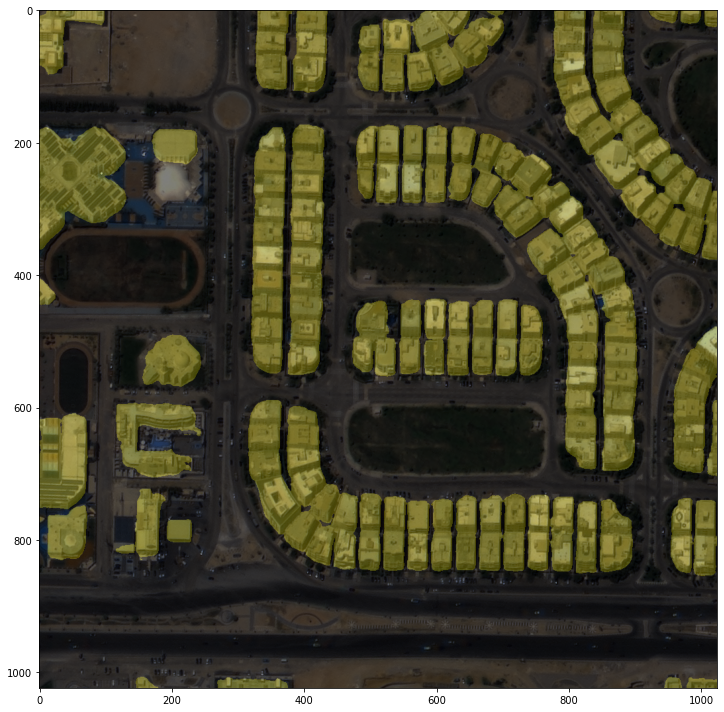

In [16]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00051_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


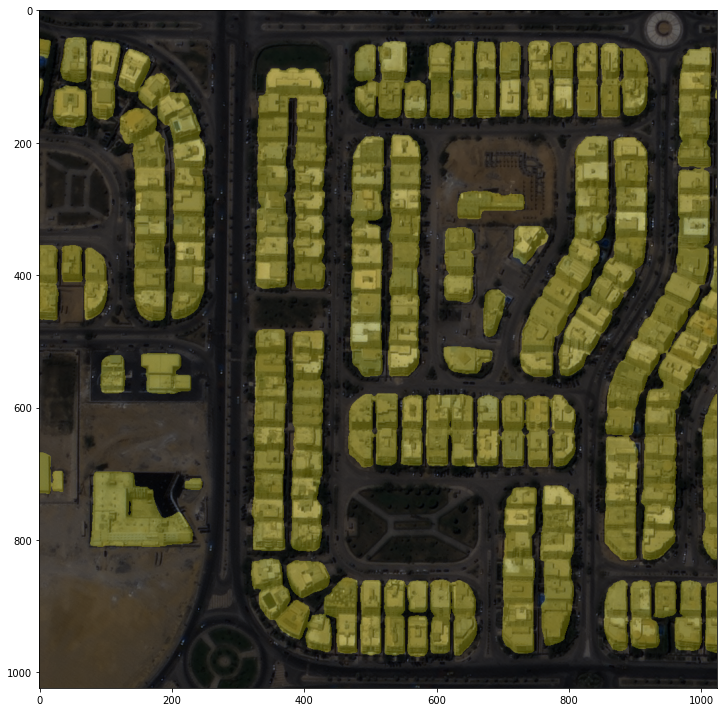

In [17]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00126_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


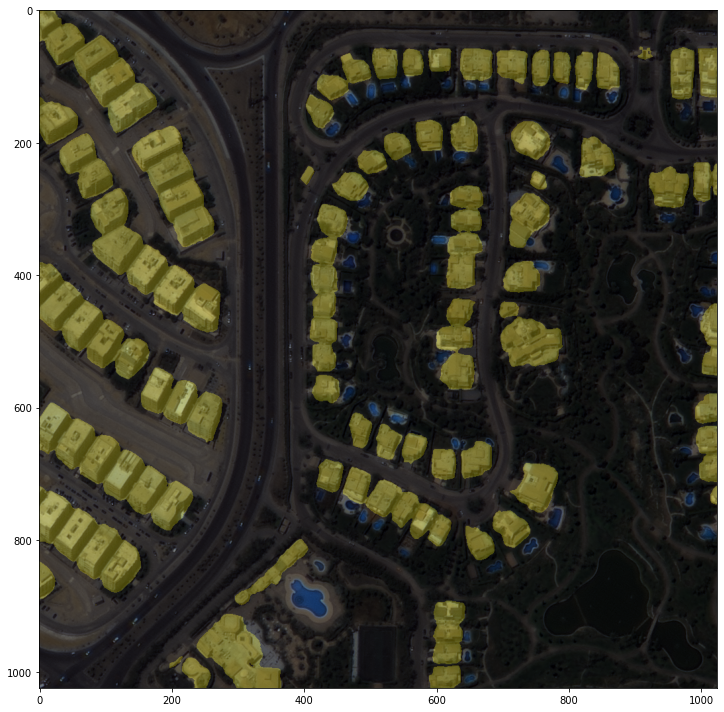

In [18]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00226_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


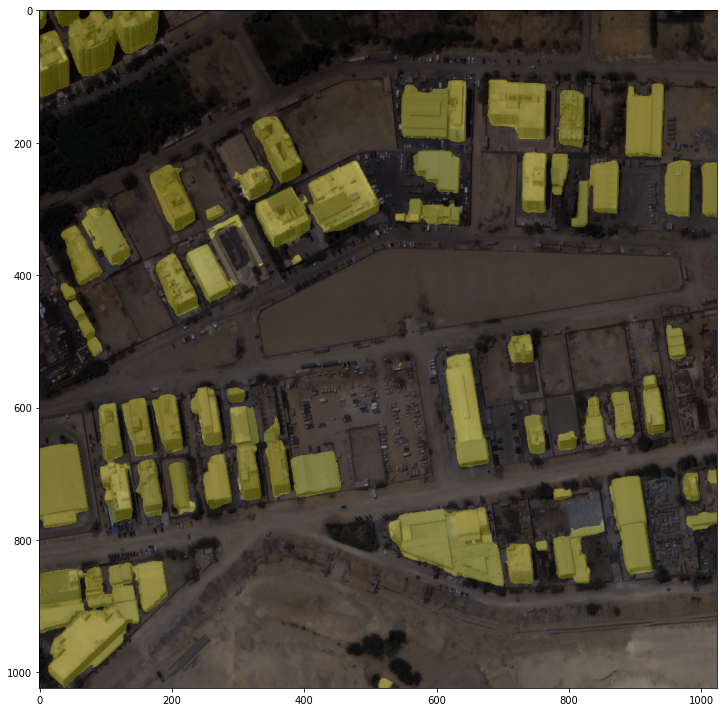

In [19]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00333_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


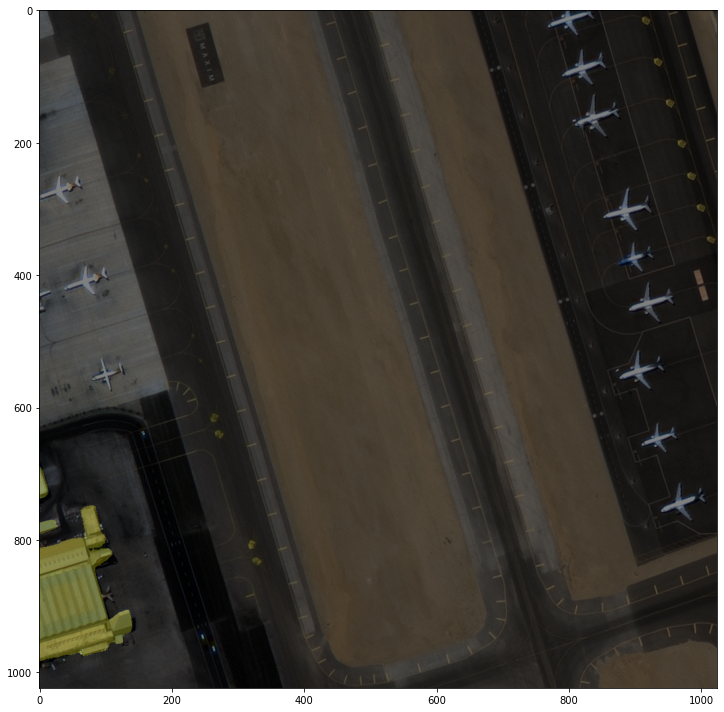

In [20]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00697_PS3_K3A_NIA0277.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


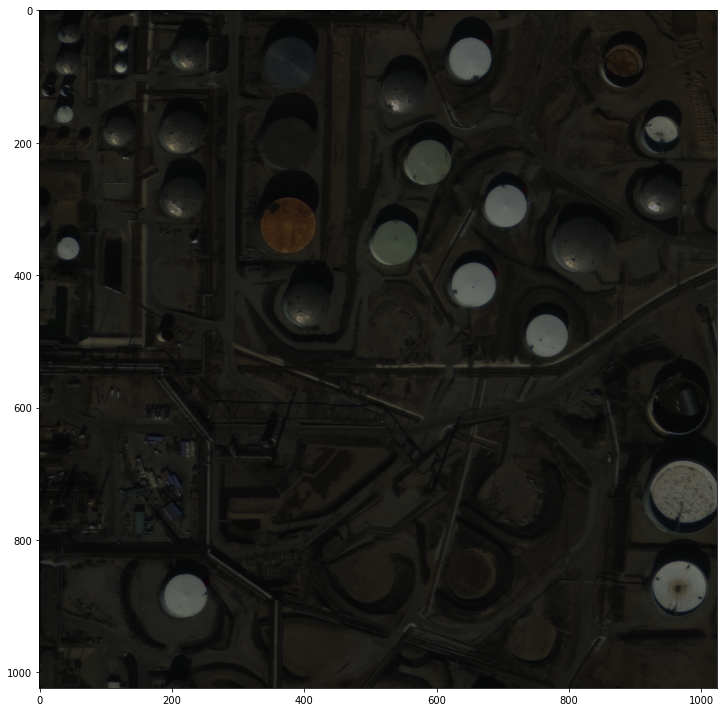

In [21]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD04404_PS3_K3A_NIA0378.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


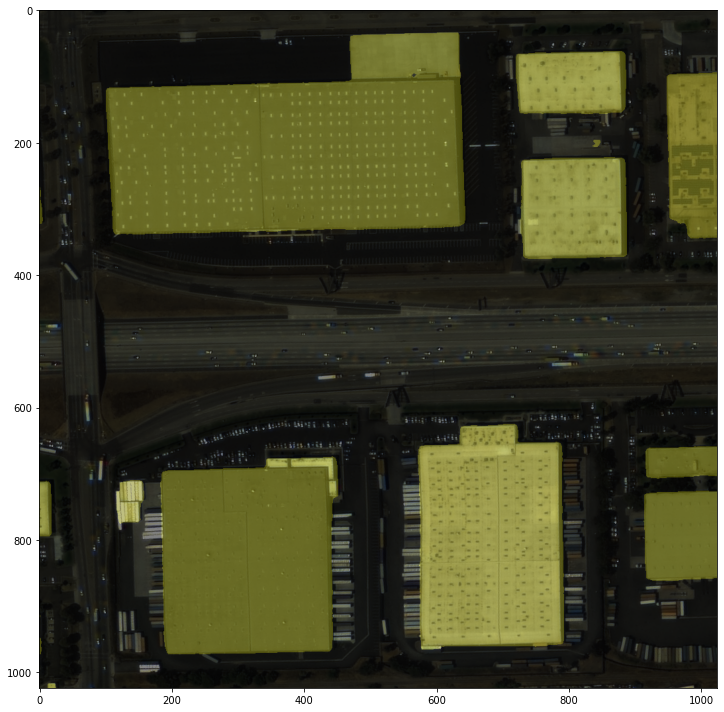

In [22]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD10921_PS3_K3A_NIA0389.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


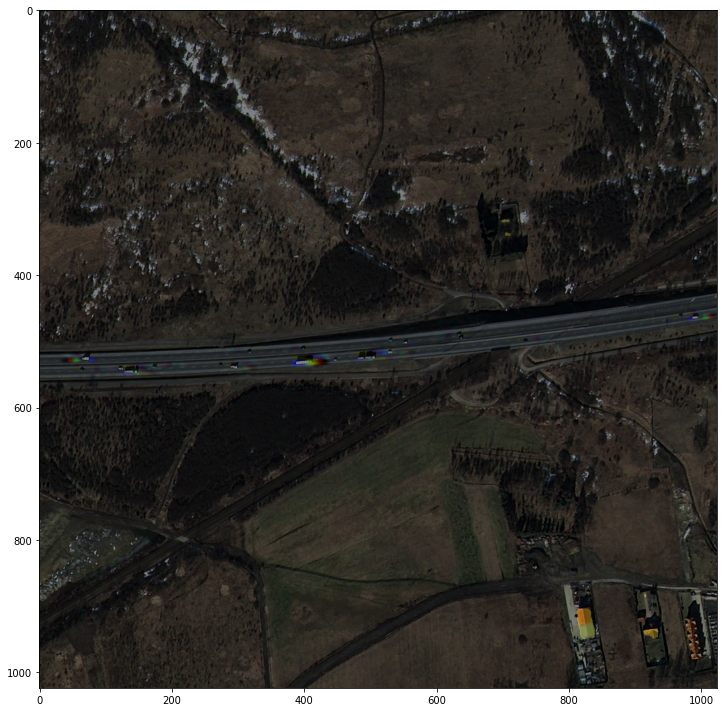

In [23]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/OBJ00176_PS3_K3_NIA0081.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


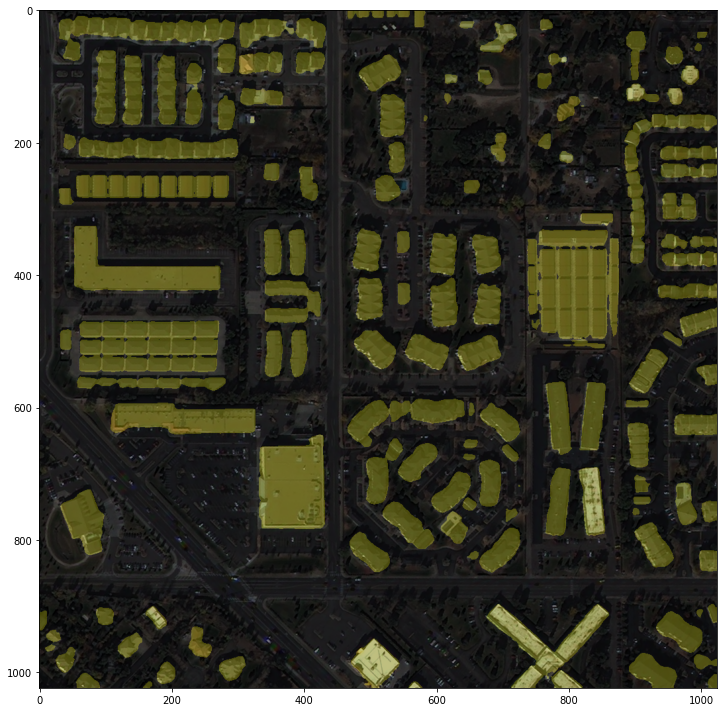

In [24]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/OBJ01050_PS3_K3_NIA0089.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


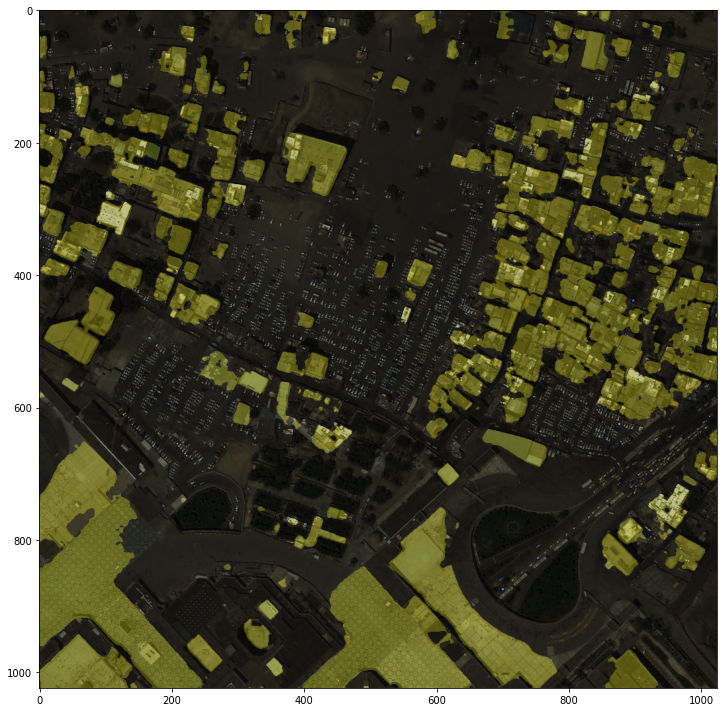

In [25]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/OBJ03670_PS3_K3A_NIA0153.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

#### 네이버 지도 이미지로 테스트

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


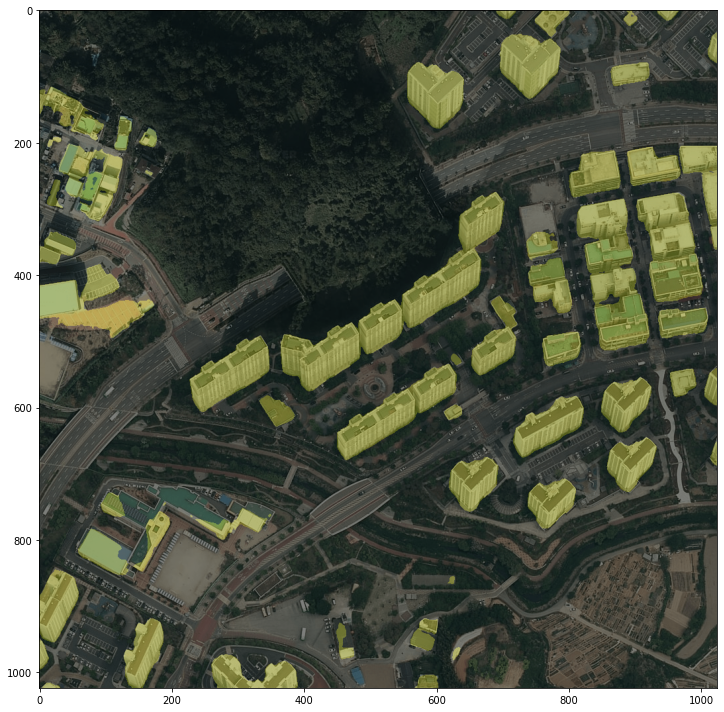

In [26]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0000.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


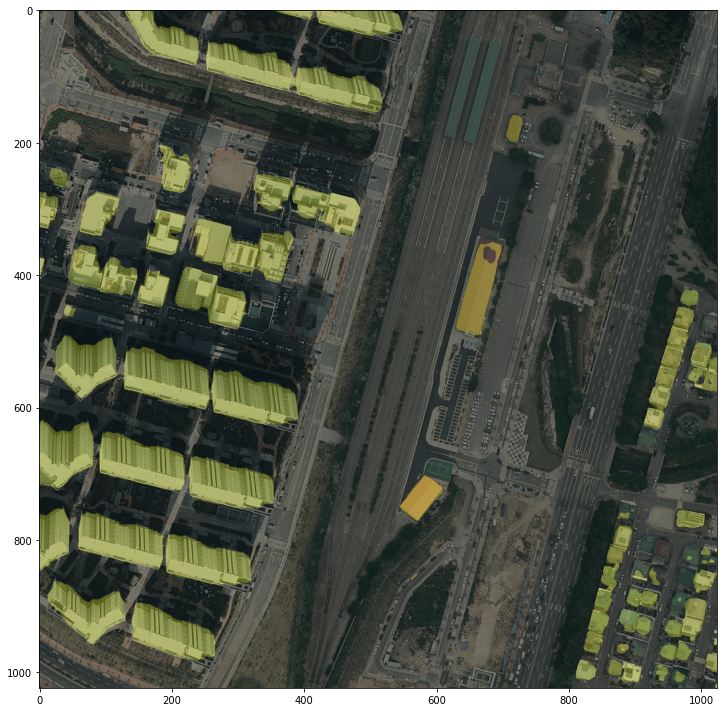

In [27]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0001.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


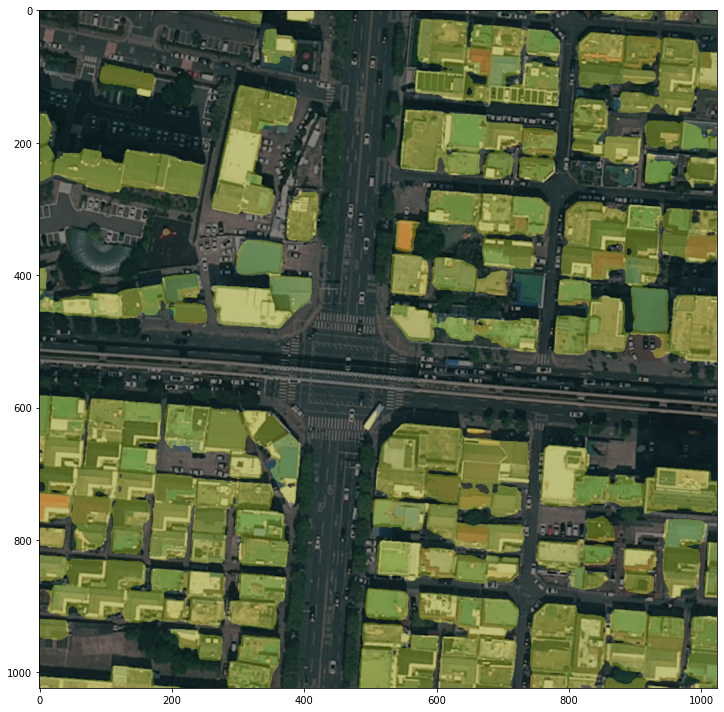

In [28]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0002.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)